# Customized pix2pix GAN
This notebook is based on the original tensorflow pix2pix GAN: https://www.tensorflow.org/tutorials/generative/pix2pix

In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
import numpy as np
from PIL import Image, ImageDraw
import glob
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14507848285481072366
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1590380112586171831
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Enable saving to Google Drive if working with colab, to external SSD, or disable if saving locally

In [2]:
def save_to(save = "locally"):
  if save == "colab":
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones
  elif save == "ssd":
    os.chdir("D:/GanNoMask")

In [3]:
save_to("ssd")

## Download the dataset and set the parameters

In [4]:
BUFFER_SIZE = 3000
BATCH_SIZE = 20
IMG_WIDTH = 128
IMG_HEIGHT = 128
OUTPUT_CHANNELS = 3
EPOCHS = 1000
imdir = "D:/GanNoMask/fulltrain"

In [5]:
def crop_1st(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((0, 0, 128, 128)).save("D:/GanNoMask/1stquarter/" + image)

In [6]:
def crop_2nd(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((128, 0, 256, 128)).save("D:/GanNoMask/2ndquarter/" + image)

In [7]:
def crop_3rd(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((128, 128, 256, 256)).save("D:/GanNoMask/3rdquarter/" + image)

In [8]:
def crop_4th(imdir):
  for image in os.listdir(imdir):
    im = Image.open(imdir + "/" + image)
    im.crop((0, 128, 128, 256)).save("D:/GanNoMask/4thquarter/" + image)

In [9]:
#crop_1st(imdir)
#crop_2nd(imdir)
#crop_3rd(imdir)
#crop_4th(imdir)

## Load the image from file

In [10]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_png(image)
  w = tf.shape(image)[1]
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)
  return real_image

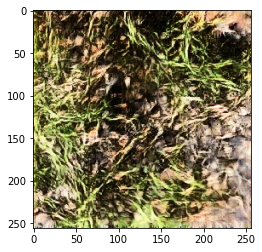

In [11]:
full = load(imdir + "/000000.png")
plt.figure()
plt.imshow(full/255.0)

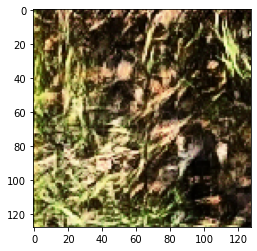

In [12]:
first = load("D:/GanNoMask/1stquarter/000000.png")
plt.figure()
plt.imshow(first/255.0)

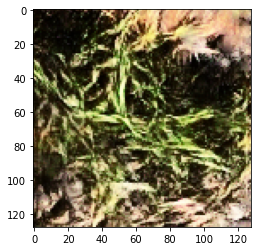

In [13]:
second = load("D:/GanNoMask/2ndquarter/000000.png")
plt.figure()
plt.imshow(second/255.0)

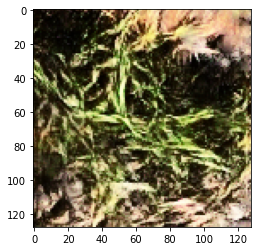

In [14]:
third = load("D:/GanNoMask/3rdquarter/000000.png")
plt.figure()
plt.imshow(second/255.0)

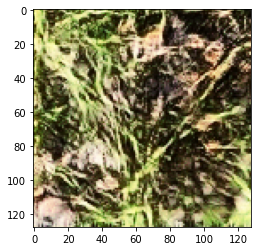

In [15]:
fourth = load("D:/GanNoMask/4thquarter/000000.png")
plt.figure()
plt.imshow(fourth/255.0)

In [16]:
def normalize(real_image):
  real_image = (real_image / 127.5) - 1
  return real_image

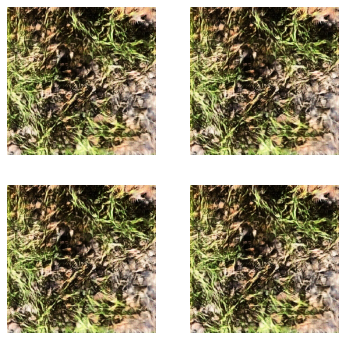

In [17]:
plt.figure(figsize=(6, 6))
for i in range(4):
  #rj_re = random_jitter(full, True)
  plt.subplot(2, 2, i+1)
  plt.imshow(full/255.0)
  plt.axis('off')
plt.show()

## Select train and test images

In [18]:
def load_image_train(image_file):
  real_image = load(image_file)
  #real_image = random_jitter(real_image, False)
  real_image = normalize(real_image)
  return real_image

Autotune use may very here depending on the version of tensorflow. The original pix2pix paper uses tensorflow.1.

# FIX RANDOM JITTER!

In [19]:
first_train_set = tf.data.Dataset.list_files("D:/GanNoMask/1stquarter/*.png", shuffle = False)
second_train_set = tf.data.Dataset.list_files("D:/GanNoMask/2ndquarter/*.png", shuffle = False)
third_train_set = tf.data.Dataset.list_files("D:/GanNoMask/3rdquarter/*.png", shuffle = False)
fourth_train_set = tf.data.Dataset.list_files("D:/GanNoMask/4thquarter/*.png", shuffle = False)
AUTOTUNE = tf.data.experimental.AUTOTUNE
first_train_set = first_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
second_train_set = second_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
third_train_set = third_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
fourth_train_set = fourth_train_set.map(load_image_train, num_parallel_calls = AUTOTUNE)
train_dataset = tf.data.Dataset.zip((first_train_set, second_train_set, third_train_set, fourth_train_set))
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
len(list(train_dataset))

150

## Define the downsampling and upsampling
Print the shape of the sample image layer after downsampling and upsampling

In [20]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides=2, 
                                    padding='same', 
                                    kernel_initializer=initializer, 
                                    use_bias=False))
  if apply_batchnorm: 
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [21]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(first, 0))
print (down_result.shape)

(1, 64, 64, 3)


In [22]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides=2, 
                                             padding='same', 
                                             kernel_initializer=initializer, 
                                             use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

In [23]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 128, 128, 3)


## Define the Generator. Plot the Generator training pipeline diagram.
Generator uses two inputs: 1-channel random noise vector and vector of x&y coordinates. Then the layers are concatenated. The resulted 3-channel layer is a subject to downsampling, with a following forwarding of the downsampled layer to a skip connection. After the input is fully downsampled, the upsampling begins, with the concatenation of the layers forwarded respectively with skip connection.

In [24]:
def Generator():
  first = tf.keras.layers.Input(shape=[128, 128, 3], name='first')
  second = tf.keras.layers.Input(shape=[128, 128, 3], name='second')
  fourth = tf.keras.layers.Input(shape=[128, 128, 3], name='fourth')

  concat = tf.keras.layers.concatenate([first, second, fourth])  # (bs, 256, 256, channels*2)
  
  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    #downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    #upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)
  
  x = concat
  
  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs = [first, second, fourth], outputs = x)

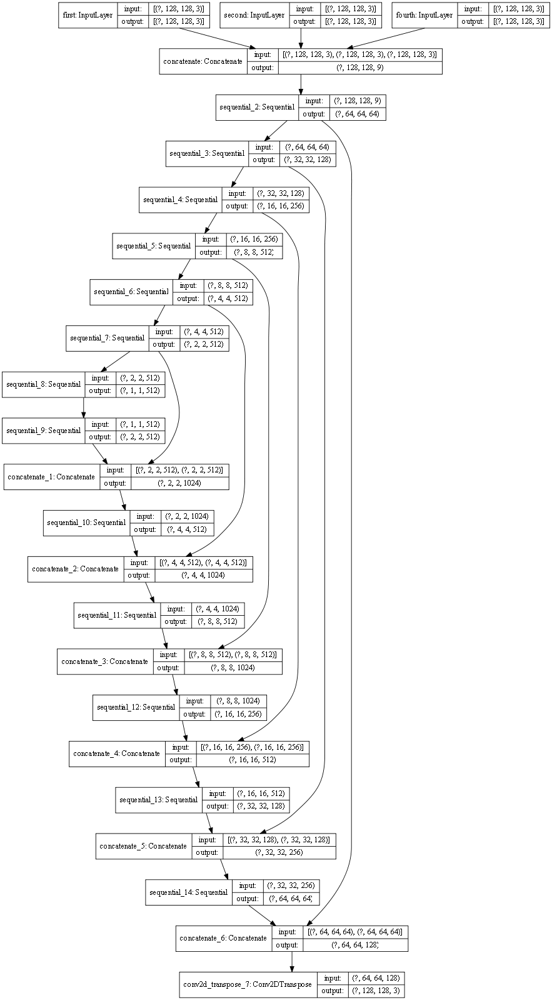

In [25]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

## Plot the Generator output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


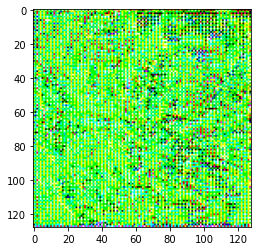

In [26]:
gen_output = generator([first[tf.newaxis, ...], second[tf.newaxis, ...], fourth[tf.newaxis, ...]], training=False)
plt.imshow(gen_output[0, ...])

## Define the Generator loss

In [27]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [28]:
def generator_loss(disc_generated_output, gen_output):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  return gan_loss

## Define the Discriminator. Plot the Discriminator training pipeline diagram.
Use the X&Y coordinates vector and the target image to create the 30x30 patches, which classify the 70x70 portions of the image (PatchGAN).

In [29]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  first = tf.keras.layers.Input(shape=[128, 128, 3], name='first')
  second = tf.keras.layers.Input(shape=[128, 128, 3], name='second')
  third = tf.keras.layers.Input(shape=[128, 128, 3], name='third')
  fourth = tf.keras.layers.Input(shape=[128, 128, 3], name='fourth')
  
  x = tf.keras.layers.concatenate([first, second, third, fourth]) 

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)
  
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(zero_pad2)# (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[first, second, third, fourth], outputs=last)

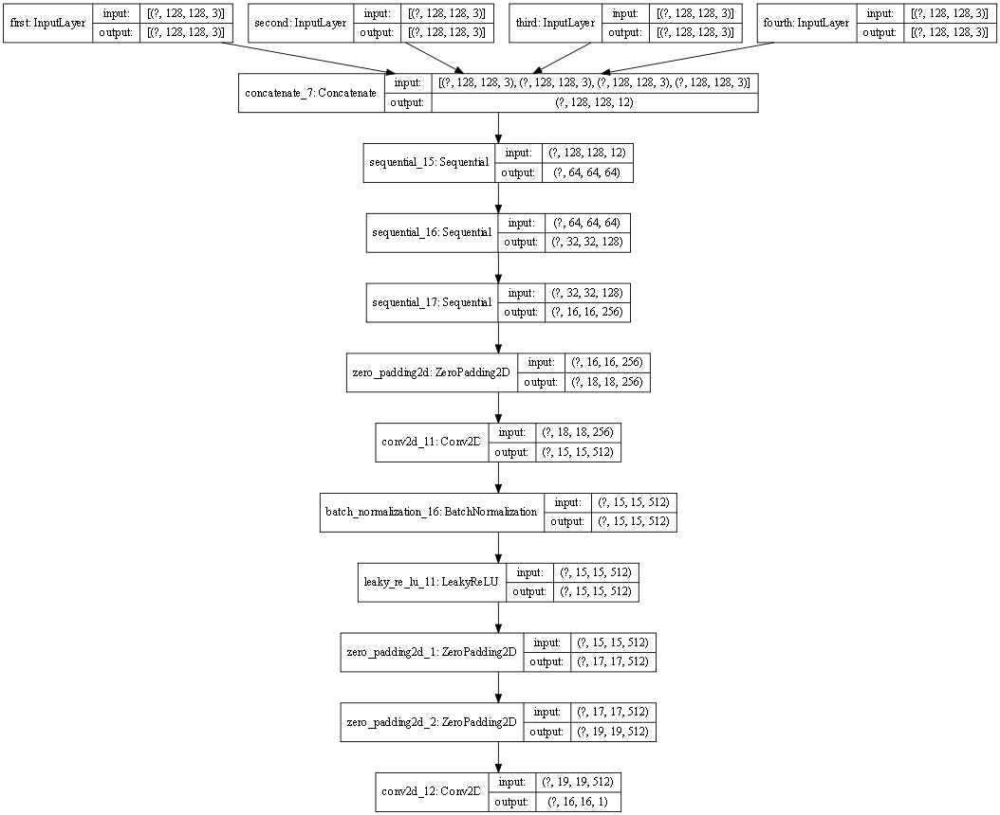

In [30]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

## Plot the patch

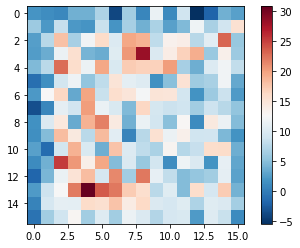

In [31]:
disc_out = discriminator([first[tf.newaxis, ...], second[tf.newaxis, ...], gen_output, fourth[tf.newaxis, ...]], training=False)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

## Define discriminator loss

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

<tf.Tensor: shape=(), dtype=float32, numpy=1.3862944>

Try to replace all with l2 loss

## Create Adam Generator and Discriminator optimizers
Parameters are used from the pix2pix.

In [33]:
def select_optimizer(optimizer):
  if optimizer == "Adam":
    generator_optimizer = tf.keras.optimizers.Adam(1e-5, beta_1 = 0.5, epsilon = 0.01)
    discriminator_optimizer = tf.keras.optimizers.Adam(1e-5, beta_1 = 0.5, epsilon = 0.01)
  elif optimizer == "SGD":
    generator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
    discriminator_optimizer = tf.keras.optimizers.SGD(0.005, momentum = 0.9, nesterov = True)
  return generator_optimizer, discriminator_optimizer

In [34]:
generator_optimizer = select_optimizer("Adam")[0]
discriminator_optimizer = select_optimizer("Adam")[1]

## Some observations on optimizers
**Adam with 2e-4, beta_1 = 0.5**: Generally, a good default choice. It can be noticed, that the improvements in the predicted image arise when the generator and discriminator losses start fluctuating. This, however, may happend at different point of time. Also, the standard runs are done for 200 epochs, and it may be benefitial to increase the number. <br>
**Adam with epsilon = 0.1 (fit\20210604-101544)**: Both generator and discriminator losses have major fluctuations from the start, which, however, does not lead to the improvement in the prediction image. Potentially needs more runs than 200. <br>
**Adam with epsilon = 0.01 (fit\20210607-152740)**: Seems to recognize shapes quicker than runs with other epsilon values. <br>
**Adam with epsilon = 0.01, beta_1 = 0.35 (fit\20210608-113325)**: "I don't seem to see the difference" (with the above run) - Olli N. <br>
**Adam with 1e-4, epsilon = 0.01 (fit\20210607-152740)**: <br>
**SGD with 0.005, momentum = 0.9, nesterov = True (fit\20210604-095025)**: Generally, Adam is considered a better default choice for the optimizer, as it is more robust towards settings. However, sometimes, stochastic gradient descents, if chosen with correct parameters, can have more precision and speed. But not in this try. <br>
**fit20210614-172200**: 1e-5. images, loop1 gif.
**Custom Adam with complex momentum**: Something to test.

## Create checkpoint and logs savers for later inspection of the predictions and losses
By default, the checkpoint is saved once every 30 epochs.

In [35]:
checkpoint_dir = './training_checkpoints_quartergan201'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator,
                                 discriminator=discriminator)
checkpoint.save(file_prefix=checkpoint_prefix)

'./training_checkpoints_quartergan201\\ckpt-1'

In [36]:
def checkpoint_save(epoch, inEpochs = 30):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

In [37]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## Define the image generation function. Plot the concatenated random noise and coordinates vectors image, the target image and the model's prediction image. 

In [38]:
def generate_images(model, first, second, third, fourth, epoch = 0, save = False, plotting = False):
  prediction = model([first, second, fourth], training = True)
  image1 = tf.concat([tf.concat([first[0], second[0]], 1), tf.concat([fourth[0], prediction[0]], 1)], 0)
  name = str(epoch).zfill(6)
  if save:
    tf.keras.preprocessing.image.save_img(("D:/GanNoMask/quartergan201/" + str(name) + ".png"), image1)
  if plotting:
    image2 = tf.concat([tf.concat([first[0], second[0]], 1), tf.concat([fourth[0], third[0]], 1)], 0)
    display_list = [image2, image1]
    for im in display_list:
      plt.imshow(im * 0.5 + 0.5)
      plt.axis('off')
      plt.show()

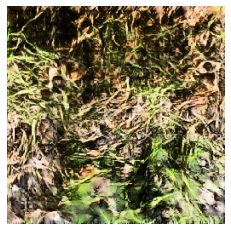

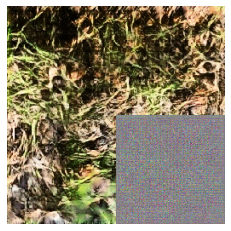

In [39]:
for first, second, third, fourth in train_dataset.take(1):
  generate_images(generator, first, second, third, fourth, plotting = True)

## Define the train step
Save losses to tensorboard.

In [40]:
@tf.function
def train_step(first, second, third, fourth, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator([first, second, fourth], training=True)

    disc_real_output = discriminator([first, second, third, fourth], training=True)
    disc_generated_output = discriminator([first, second, gen_output, fourth], training=True)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    
    generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    
  
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

## Define the fit function
Show one prediction for the random image per epoch. Create basic interface (the interface might not work well if using tensorflow.2). Create checkpoints with the default interval and save the last epoch as well. 

# ADD SAVING EACH 50TH EPOCH

In [41]:
def fit(train_ds, epochs):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for first, second, third, fourth in train_ds.take(1):
      generate_images(generator, first, second, third, fourth, epoch = epoch, save = True)
    print("Epoch: ", epoch)

    # Train
    for n, (first, second, third, fourth) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(first, second, third, fourth, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

## Initiate tensorboard to view the losses from the runs

In [21]:
%load_ext tensorboard

In [22]:
%tensorboard --logdir {log_dir} --host localhost --port 6162

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 15848.

## Fit the model

In [ ]:
fit(train_dataset, EPOCHS)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-23-70c8faf2a469>", line 1, in <module>
    fit(train_dataset, EPOCHS)
NameError: name 'train_dataset' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3\lib\site-pa

## Load the checkpoint
By default, the latest checkpoint is loaded. Else, set latest = False and specify the number of the checkpoint.

In [52]:
def load_ckpt(latest = True, number = 1):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints_quartergan201/ckpt-' + str(number))

In [53]:
load_ckpt(False, 11)

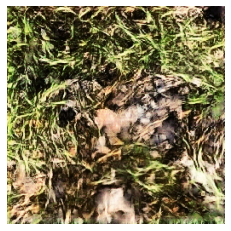

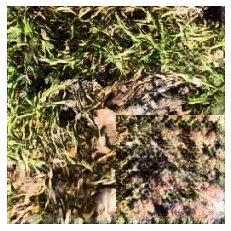

In [54]:
for first, second, third, fourth in train_dataset.take(1):
  generate_images(generator, first, second, third, fourth, plotting = True)

## Concatenate the inferences horizontally

In [ ]:
im = Image.open("hopper.jpg") as im

In [ ]:
image = np.empty([20, 256, 2048, 3])
half = np.empty([20, 256, 128, 3])
for left, right in train_dataset.take(1):
  prediction = generator(left, training = True)
  half = prediction
  image = tf.concat([left, prediction], axis = 2)
  for i in range(14):
    prediction = generator(half, training = True)
    image = tf.concat([image, prediction], axis = 2)
    half = prediction

In [48]:
image = np.empty([20, 256, 2048, 3])
quarter = np.empty([20, 128, 128, 3])
for first, second, third, fourth in train_dataset.take(1):
  prediction = generator(generator, first, second, fourth, training = True)
  image = tf.concat([tf.concat([first, second], 2), tf.concat([fourth, prediction], 1)], 0)
  quarter = prediction
  for i in range(14):
    prediction = generator(generator, first, second, fourth, training = True)
    image = tf.concat([tf.concat([first, second], 2), tf.concat([fourth, prediction], 1)], 0)
    quarter = prediction

TypeError: call() got multiple values for argument 'training'

In [ ]:
image

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 264
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-28935580a9bb>", line 1, in <module>
    image
NameError: name 'image' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_o

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-28935580a9bb>", line 1, in <module>
    image
NameError: name 'image' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.p

In [ ]:
plt.figure(figsize = (20, 10))
plt.imshow(image[0] * 0.5 + 0.5)
plt.axis('off')
plt.show()

ERROR! Session/line number was not unique in database. History logging moved to new session 265


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-497cb48cf83f>", line 1, in <module>
    plt.figure(figsize = (20, 10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3\lib\site-packages

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-497cb48cf83f>", line 1, in <module>
    plt.figure(figsize = (20, 10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\

## Continuity analysis

In [ ]:
generated = []
original = []
for left, right in train_dataset.take(1):
  #generate_images(generator, left, save = False, plotting = True)
  prediction = generator(left, training = True)
  image1 = tf.concat([left[0], prediction[0]], 1)
  image2 = tf.concat([left[0], right[0]], 1)
  #image1 = image1 * 0.5 + 0.5
  #image2 = image2 * 0.5 + 0.5
  image1, image2 = tf.image.rgb_to_grayscale([image1, image2])
  generated.append(image1)
  original.append(image2)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 266
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-32f623a4b3d6>", line 3, in <module>
    for left, right in train_dataset.take(1):
NameError: name 'train_dataset' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return 

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-32f623a4b3d6>", line 3, in <module>
    for left, right in train_dataset.take(1):
NameError: name 'train_dataset' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\s

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-32f623a4b3d6>", line 3, in <module>
    for left, right in train_dataset.take(1):
NameError: name 'train_dataset' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\s

In [ ]:
plt.imshow(generated[0])
plt.axis('off')
plt.show()
plt.imshow(original[0])
plt.axis('off')
plt.show()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 267
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-857740775a6e>", line 1, in <module>
    plt.imshow(generated[0])
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, 

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-857740775a6e>", line 1, in <module>
    plt.imshow(generated[0])
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\i

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-857740775a6e>", line 1, in <module>
    plt.imshow(generated[0])
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\i

In [ ]:
#xyx = np.empty([255, 1])
xyx = []
for i in range(255):
  xyx.append(abs(original[0][i][:] - original[0][i + 1][:]))

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 268
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-6ecfbedac3d0>", line 4, in <module>
    xyx.append(abs(original[0][i][:] - original[0][i + 1][:]))
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-6ecfbedac3d0>", line 4, in <module>
    xyx.append(abs(original[0][i][:] - original[0][i + 1][:]))
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-6ecfbedac3d0>", line 4, in <module>
    xyx.append(abs(original[0][i][:] - original[0][i + 1][:]))
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda

In [24]:
xyx

[]

ERROR! Session/line number was not unique in database. History logging moved to new session 269


In [ ]:
plt.figure(figsize=(10,10))
plt.plot(abs(original[0][1][:] - original[0][2][:]), range(256), c = "b")
plt.gca().invert_yaxis()
plt.ylim(128, 256)
plt.yticks(np.arange(128, 257, step = 32))
plt.show()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-f5ee47229180>", line 1, in <module>
    plt.figure(figsize=(10,10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3\lib\site-packages\IP

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-f5ee47229180>", line 1, in <module>
    plt.figure(figsize=(10,10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\cor

In [ ]:
realarr = np.empty([256, 1])
#genarr = np.array([])
#for i in range(5):
#for row in range(256):
np.append(realarr, abs(original[0][:][0] - original[0][:][1]), axis = 0)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 270
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-4351fd03a9e1>", line 1, in <module>
    realarr = np.empty([256, 1])
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(et

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-4351fd03a9e1>", line 1, in <module>
    realarr = np.empty([256, 1])
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\cor

In [ ]:
original[0][:][0] - original[0][:][1]

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 271
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a7e7f876dbe4>", line 1, in <module>
    original[0][:][0] - original[0][:][1]
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinne

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a7e7f876dbe4>", line 1, in <module>
    original[0][:][0] - original[0][:][1]
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\I

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a7e7f876dbe4>", line 1, in <module>
    original[0][:][0] - original[0][:][1]
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\I

In [ ]:
original[0][:][1]

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 272
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-3e00878eace3>", line 1, in <module>
    original[0][:][1]
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-3e00878eace3>", line 1, in <module>
    original[0][:][1]
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interact

In [ ]:
realarr

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 273
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-d03b739f6d50>", line 1, in <module>
    realarr
NameError: name 'realarr' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lin

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-d03b739f6d50>", line 1, in <module>
    realarr
NameError: name 'realarr' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshe

In [ ]:
plt.gca().invert_yaxis()
plt.yticks(np.arange(0, 257, step = 32))
plt.scatter(realarr,y = range(256))
plt.show()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 274
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-6bcde88a776d>", line 1, in <module>
    plt.gca().invert_yaxis()
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, 

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-6bcde88a776d>", line 1, in <module>
    plt.gca().invert_yaxis()
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\i

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



  File "C:\ProgramData\Miniconda3\lib\site-packages\tensorflow_core\python\autograph\__init__.py", line 39, in <module>
    from tensorflow.python.autograph.impl.api import AutoGraphError
ImportError: cannot import name 'AutoGraphError' from 'tensorflow.python.autograph.impl.api' (C:\ProgramData\Miniconda3\lib\site-packages\tensorflow_core\python\autograph\impl\api.py)
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-6bcde88a776d>", line 1, in <module>
    plt.gca().invert_yaxis()
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no at

In [ ]:
fig = plt.figure(figsize=(5,10))
ax1 = fig.add_subplot(111)
plt.gca().invert_yaxis()
plt.yticks(np.arange(0, 257, step = 32))
ax1.scatter(lol[128], y = range(255), c='b')
ax1.scatter(lol1[128], y = range(255), c='r')
plt.show()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 275
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-0d82344a6294>", line 1, in <module>
    fig = plt.figure(figsize=(5,10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerfram

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-0d82344a6294>", line 1, in <module>
    fig = plt.figure(figsize=(5,10))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPytho

In [ ]:
rar = []
for row in range(255):
  rar.append(abs(generated[0][row] - original[0][row])[128])
rar = np.array(rar)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 276
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-21a161d33af9>", line 3, in <module>
    rar.append(abs(generated[0][row] - original[0][row])[128])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-21a161d33af9>", line 3, in <module>
    rar.append(abs(generated[0][row] - original[0][row])[128])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-21a161d33af9>", line 3, in <module>
    rar.append(abs(generated[0][row] - original[0][row])[128])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'IndexError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda

In [ ]:
np.max(rar)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 277
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-66e7349c8833>", line 1, in <module>
    np.max(rar)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_line

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-66e7349c8833>", line 1, in <module>
    np.max(rar)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshel

In [ ]:
plt.plot(rar, range(255))
plt.gca().invert_yaxis()
plt.yticks(np.arange(0, 257, step = 32))
plt.show()

ERROR! Session/line number was not unique in database. History logging moved to new session 278


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a32d91e10bff>", line 1, in <module>
    plt.plot(rar, range(255))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPyt

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a32d91e10bff>", line 1, in <module>
    plt.plot(rar, range(255))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-a32d91e10bff>", line 1, in <module>
    plt.plot(rar, range(255))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\

In [ ]:
b = []
d = []
for i in range(255):
  a = np.mean([original[0][i], original[0][i+1]], axis = 0)
  c = np.mean([generated[0][i], generated[0][i+1]], axis = 0)
  b.append(np.sum(a, axis = 0))
  d.append(np.sum(c, axis = 0))
b = np.array(b)
d = np.array(d)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 279
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-94284b9ce6c7>", line 4, in <module>
    a = np.mean([original[0][i], original[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    re

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-94284b9ce6c7>", line 4, in <module>
    a = np.mean([original[0][i], original[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-94284b9ce6c7>", line 4, in <module>
    a = np.mean([original[0][i], original[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\

In [ ]:
plt.plot(abs(b - d))

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR! Session/line number was not unique in database. History logging moved to new session 280
Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-5b8fde7bfb85>", line 1, in <module>
    plt.plot(abs(b - d))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, numb

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-5b8fde7bfb85>", line 1, in <module>
    plt.plot(abs(b - d))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\inter

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-5b8fde7bfb85>", line 1, in <module>
    plt.plot(abs(b - d))
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\inter

In [25]:
d

[]

ERROR! Session/line number was not unique in database. History logging moved to new session 281


In [ ]:
b = []
for i in range(255):
  a = np.mean([smth[0][i], smth[0][i+1]], axis = 0)
  b.append(np.sum(a, axis = 0))
b = np.array(b)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-26-5c7adec0ead2>", line 3, in <module>
    a = np.mean([smth[0][i], smth[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-26-5c7adec0ead2>", line 3, in <module>
    a = np.mean([smth[0][i], smth[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-26-5c7adec0ead2>", line 3, in <module>
    a = np.mean([smth[0][i], smth[0][i+1]], axis = 0)
NameError: name 'np' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site

In [26]:
b

[]

ERROR! Session/line number was not unique in database. History logging moved to new session 282


In [ ]:
plt.figure()
#plt.yticks(np.arange(0, 1.01, step = 0.1))
#plt.xticks(np.arange(1, 8, step = 1))
plt.plot(b)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-27-c1a96e16f212>", line 1, in <module>
    plt.figure()
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\ultr

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-27-c1a96e16f212>", line 1, in <module>
    plt.figure()
NameError: name 'plt' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3357, in run_ast_nodes
    if (await self.run_code(code, result,  async_=asy)):
  File "C:\ProgramData\Miniconda3\lib\site-packages\IPython\core\interactivesh